In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# for label encoding
from sklearn.preprocessing import (label_binarize, 
                                  LabelEncoder)

# Decision tree model
from sklearn.tree import DecisionTreeClassifier

# Grid Search (to find best hyperparameters)
from sklearn.model_selection import (GridSearchCV, 
                                    ShuffleSplit, 
                                    cross_val_score)

# for evaluation
from sklearn.metrics import (accuracy_score, 
                            precision_score, 
                            recall_score, 
                            f1_score, 
                            plot_confusion_matrix, 
                            confusion_matrix, 
                            mean_squared_error,
                            roc_curve, 
                            precision_recall_curve, 
                            average_precision_score)

# for multi-label prediction
from sklearn.multiclass import OneVsRestClassifier

# for decision tree plot
from io import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus

In [2]:
df_train = pd.read_csv('df_train.data')
df_test = pd.read_csv('df_test.data')

display('train dataset', df_train, 'test dataset', df_test)

'train dataset'

,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx,lettr
0,0.200,0.267,0.267,0.400,0.400,0.533,0.600,0.333,0.000,0.533,0.400,0.400,0.333,0.600,0.333,0.533,P
1,0.267,0.600,0.333,0.467,0.267,0.333,0.467,0.400,0.333,0.600,0.533,0.667,0.133,0.533,0.267,0.600,G
2,0.333,0.600,0.333,0.400,0.133,0.267,0.467,0.600,0.133,0.467,0.333,0.733,0.267,0.533,0.133,0.733,K
3,0.200,0.333,0.333,0.467,0.333,0.600,0.667,0.200,0.067,0.533,0.400,0.467,0.200,0.667,0.533,0.400,H
4,0.267,0.467,0.267,0.333,0.267,0.467,0.533,0.333,0.600,0.467,0.467,0.600,0.067,0.600,0.467,0.533,Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13969,0.067,0.467,0.133,0.333,0.067,0.867,0.200,0.467,0.267,0.867,0.200,0.733,0.000,0.400,0.000,0.533,J
13970,0.133,0.200,0.200,0.133,0.133,0.533,0.467,0.133,0.333,0.667,0.333,0.467,0.133,0.533,0.200,0.600,B
13971,0.200,0.067,0.267,0.200,0.200,0.533,0.400,0.400,0.267,0.467,0.467,0.533,0.467,0.400,0.133,0.467,M
13972,0.133,0.267,0.200,0.200,0.133,0.400,0.467,0.400,0.400,0.400,0.400,0.733,0.133,0.600,0.267,0.600,G


'test dataset'

,x-box,y-box,width,high,onpix,x-bar,y-bar,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx,lettr
0,0.231,0.467,0.357,0.333,0.133,0.533,0.400,0.467,0.533,0.400,0.333,0.643,0.067,0.500,0.400,0.733,G
1,0.231,0.400,0.357,0.267,0.333,0.533,0.400,0.333,0.133,0.467,0.400,0.500,0.467,0.571,0.200,0.600,O
2,0.231,0.467,0.286,0.467,0.200,0.467,0.400,0.533,0.333,0.333,0.400,0.500,0.200,0.500,0.333,0.600,Q
3,0.231,0.267,0.357,0.200,0.133,0.467,0.533,0.133,0.533,0.733,0.400,0.571,0.133,0.500,0.267,0.533,E
4,0.462,0.600,0.643,0.467,0.267,0.467,0.667,0.133,0.533,0.933,0.400,0.143,0.067,0.643,0.200,0.533,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5985,0.462,0.667,0.571,0.533,0.600,0.467,0.400,0.400,0.267,0.533,0.467,0.500,0.267,0.643,0.533,0.733,F
5986,0.385,0.667,0.500,0.533,0.267,0.667,0.467,0.200,0.400,0.800,0.200,0.214,0.133,0.571,0.200,0.600,P
5987,0.077,0.000,0.143,0.000,0.000,0.467,0.467,0.200,0.667,0.533,0.400,0.500,0.000,0.500,0.400,0.533,Z
5988,0.154,0.267,0.286,0.200,0.133,0.400,0.467,0.400,0.400,0.400,0.400,0.643,0.133,0.500,0.267,0.600,G


In [3]:
X_train = df_train.loc[:, 'x-box':'yegvx']
Y_train = df_train[['lettr']]

X_test = df_test.loc[:, 'x-box':'yegvx']
Y_test = df_test[['lettr']]


# convert class labels to int (so can calc MSE (it only takes int not str))
# # LabelEncoder --> give int to each label
le = LabelEncoder()
le.fit(df_train['lettr'])

Y_train = pd.DataFrame(le.transform(df_train['lettr']), columns=['lettr'])
Y_test = pd.DataFrame(le.transform(df_test['lettr']), columns=['lettr'])
# display(pd.concat([df_train[['lettr']], Y_train], axis=1))
# display(pd.concat([df_test[['lettr']], Y_test], axis=1))


# convert class labels to binary (so can calc ROC curve, precision-recal curve of multiclass df)
# Label Binarize --> make labels binary BOn predict probability
# actually is one-hot method
n_classes = len(set(df_train['lettr']))
Y_train_binarized = label_binarize(df_train['lettr'], classes=[*range(n_classes)])
Y_test_binarized = label_binarize(df_test['lettr'], classes=[*range(n_classes)])

### Create our train test input(X), real_output(Y)

### evaluation metrics setup

In [4]:
def confusion_matrix_plotter(model, x_input, y_output_real, labels):
    '''
    plot confusion matrix for the specified model, given input, real_output and lables
    '''
    fig, ax = plt.subplots(figsize=(30, 30))
    
    disp = plot_confusion_matrix(model, x_input, y_output_real,
                                     display_labels= labels.value_counts().sort_index().index.map(lambda x: x[0]),
                                     cmap=plt.cm.Blues,
                                     normalize='true',
                                     ax=ax)

    disp.ax_.set_title('Confusion matrix, with normalization')

    plt.show()
    
def measure_error(y_true, y_pred, average, label='empty'):
    '''
    A function to return the specified error metrics for a given label
    '''
    return pd.Series({'accuracy': accuracy_score(y_true, y_pred),
                      'precision': precision_score(y_true, y_pred, average=average),
                      'recall': recall_score(y_true, y_pred, average=average),
                      'f1': f1_score(y_true, y_pred, average=average),
                      'MSE': mean_squared_error(y_true, y_pred)},
#                      },
                      name=label)

def residual_scatter(y_real, y_pred):
    '''
    plot actual (real) vs predicted residual
    '''
    sns.set_context('notebook')
    sns.set_style('white')
    fig = plt.figure(figsize=(6,6))
    ax = plt.axes()

    ph_test_predict = pd.DataFrame({'actual':y_real['lettr'],
                                    'predict': y_pred}).set_index('actual').sort_index()

    ph_test_predict.plot(marker='o', ls='', ax=ax)
    ax.set(xlabel='Actual', ylabel='Predict', xlim=(0,35), ylim=(0,35));
    
def evaluation_metrics(model):
    '''
    return a table of the specifed evaluation metrics for a multi-class problem
    '''
    df_list_error = []
    for X, Y in [(X_train, Y_train), (X_test, Y_test)]:
        y_real = Y
        y_predict = model.predict(X)

        # create common error metrics (for multi-class classification)
        test_error = {}
        for average in ['micro', 'macro', 'weighted']:
            test_error[average] = measure_error(y_real, y_predict, average)

        df_list_error.append(pd.DataFrame(test_error))

        #plot residual
        residual_scatter(y_real, y_predict)

    dtc_error_1 = pd.concat([df_list_error[0], df_list_error[1]], keys=['train set', 'test set'])
    display(dtc_error_1)

def cross_val(model, x_input, y_output_real):
    cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)
    return cross_val_score(model, x_input, y_output_real, cv=cv)

def precision_recall_curve(model, X_test, Y_test_binarized):
    y_score = model.predict_proba(X_test)
    precision = dict()
    recall = dict()
    average_precision = dict()
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(Y_test[:, i], y_score[:, i])
        average_precision[i] = average_precision_score(Y_test[:, i], y_score[:, i])

    # A "micro-average": quantifying score on all classes jointly
    precision["micro"], recall["micro"], _ = precision_recall_curve(Y_test.ravel(),
        y_score.ravel())
    average_precision["micro"] = average_precision_score(Y_test, y_score,
                                                         average="micro")
    print('Average precision score, micro-averaged over all classes: {0:0.2f}'
          .format(average_precision["micro"]))
    
# def one_vs_rest_classifier(a_model):
#     def wrapper(*args, **kwargs):
#         classifier = OneVsRestClassifier(a_model)
#         classifier.fit(X_train, Y_train)
#         y_score = classifier.decision_function(X_test)
#     return wrapper

### train the model

In [5]:
# to avoid having overfitting and computation complexity we set a max num of feat for choosing out split (change it to fine tune)
# 

dtc = DecisionTreeClassifier(random_state=12)
# dtc = DecisionTreeClassifier(criterion='entropy', random_state=12)
# dtc = DecisionTreeClassifier(criterion='entropy', random_state=12, max_depth=25)
# with Gini Index we end up with max_depth=30 albeit our parameters were identical
# dtc = DecisionTreeClassifier(criterion='gini', max_depth=25, random_state=12)
# dtc = DecisionTreeClassifier(criterion='entropy', min_samples_split=5, random_state=12)
# dtc = DecisionTreeClassifier(criterion='entropy', min_samples_split=5, max_depth=13, random_state=12)
# dtc = DecisionTreeClassifier(criterion='entropy', max_features=10, max_depth=25, min_samples_split=50, min_samples_leaf=25, random_state=12)

display(dtc.get_params())
    
# use cross-validation to fine tune hyperparameters
cross_score = cross_val(dtc, X_train, Y_train)

print(f"{'-' * 50}\n{cross_score.mean(): 0.2f} accuracy with a standard deviation of {cross_score.std(): 0.2f}")

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 12,
 'splitter': 'best'}

--------------------------------------------------
 0.84 accuracy with a standard deviation of  0.01


### Visualize our Decision Tree

node count: 3875
max depth: 28
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.135552 to fit



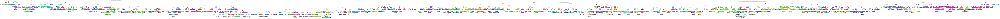

In [6]:
dtc = dtc.fit(X_train, Y_train)

# show some attr of our fitted model
print(f"node count: {dtc.tree_.node_count}\nmax depth: {dtc.tree_.max_depth}")
# help(dtc_fit.tree_)

# Create an output destination for the file
dot_data = StringIO()

export_graphviz(dtc, out_file=dot_data, filled=True, feature_names=X_train.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

# Save the tree image
filename = '3.decision_tree.png'
graph.write_png(filename)

# View the tree image
Image(filename=filename) 

### Predict & Validate our model

micro      macro   weighted
train set accuracy    1.000000   1.000000   1.000000
          precision   1.000000   1.000000   1.000000
          recall      1.000000   1.000000   1.000000
          f1          1.000000   1.000000   1.000000
          MSE         0.000000   0.000000   0.000000
test set  accuracy    0.733055   0.733055   0.733055
          precision   0.733055   0.735359   0.736111
          recall      0.733055   0.733318   0.733055
          f1          0.733055   0.731274   0.731519
          MSE        25.662437  25.662437  25.662437

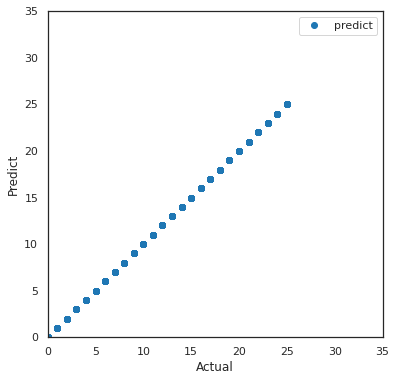

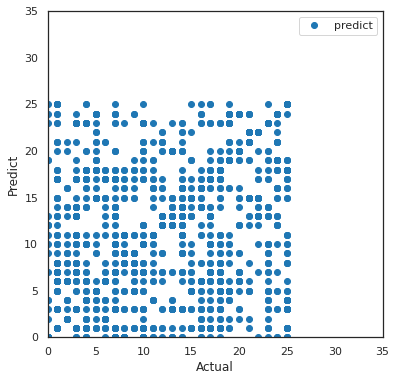

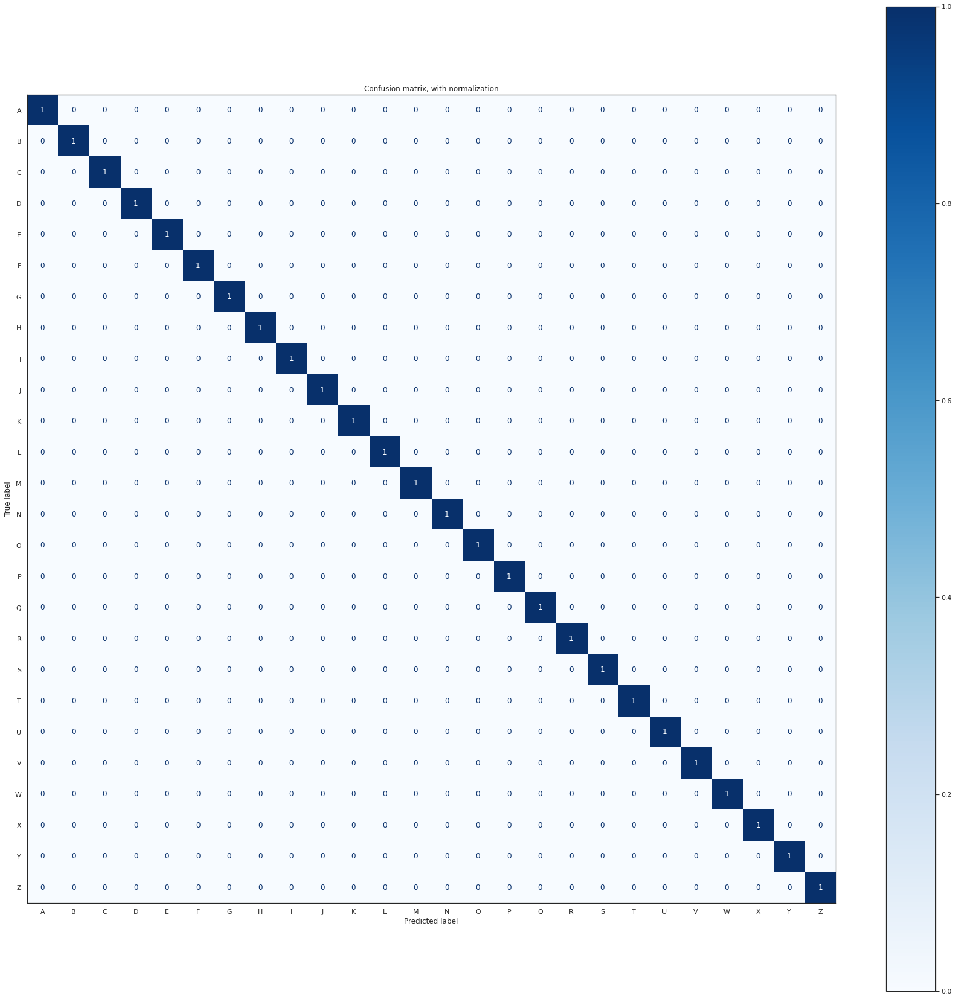

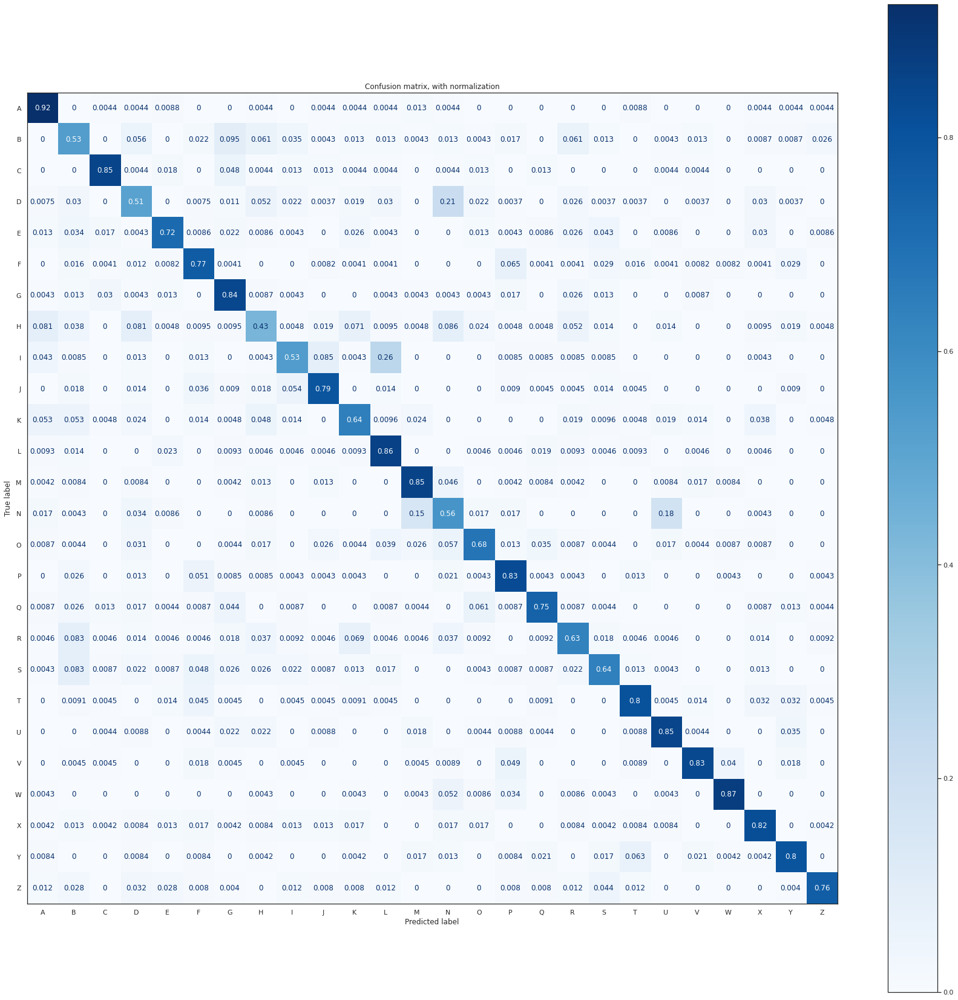

In [7]:
%matplotlib inline
eval_metric = evaluation_metrics(dtc)

# classifier = OneVsRestClassifier(dtc)
# classifier.fit(X_train, Y_train)
# precision_recall_curve(classifier, X_test, Y_test_binarized)

for X, Y in [(X_train, Y_train), (X_test, Y_test)]:
    confusion_matrix_plotter(dtc, X, Y, df_test['lettr'])

    
# ROC curves are typically used in binary classification to study the output of a classifier. 
# In order to extend ROC curve and ROC area to multi-label classification, it is necessary to binarize the output. 
# One ROC curve can be drawn per label, but one can also draw a ROC curve by considering each element of the label indicator matrix 
# as a binary prediction (micro-averaging).

### Using Grid Search
#### to find optimal max_depth and node_count for our decision tree

In [8]:
# # using previous learnt Decision Tree (dtc) parameters (for GridSearch)
# # the gridcv model is overfitted using this param(s) albeit cross_val of 84%
# # i.e., nod_count: 3907, max_depth: 21
# param_grid = {'max_depth':range(1, dtc.tree_.max_depth+1, 2),
#               'max_features': range(1, len(dtc.feature_importances_)+1)}

# using standalone parameters (for GridSearch)
# it gives us the same result as above param(s) (84% cross_val) but with way fewer node_count & max_depth
# using max_depth more than 10 would result in overfitting
param_grid = {'max_depth': range(2, 11, 2),
              'max_features': range(6, 17, 2),
              'max_leaf_nodes': range(50, 400, 50),
              'min_samples_leaf': range(10, 200, 10),
             }

# instantiate a grid search
gr = GridSearchCV(DecisionTreeClassifier(random_state=12),
                  param_grid=param_grid,
                  scoring='f1_weighted',
                  n_jobs=-1)

# use cross-validation to fine tune hyperparameters
cross_score = cross_val(dtc, X_train, Y_train)

print(f"{'-' * 50}\n{cross_score.mean(): 0.2f} accuracy with a standard deviation of {cross_score.std(): 0.2f}")

--------------------------------------------------
 0.84 accuracy with a standard deviation of  0.01


### Visualize our Decision Tree

node count: 399
max depth: 10
Best Criterion:
('ccp_alpha', 0.0)
('class_weight', None)
('criterion', 'gini')
('max_depth', 10)
('max_features', 14)
('max_leaf_nodes', 200)
('min_impurity_decrease', 0.0)
('min_impurity_split', None)
('min_samples_leaf', 10)
('min_samples_split', 2)
('min_weight_fraction_leaf', 0.0)
('random_state', 12)
('splitter', 'best')
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.660172 to fit



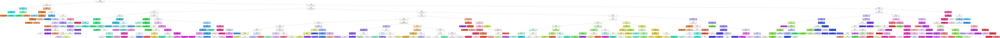

In [9]:
gr = gr.fit(X_train, Y_train) 

# show some attr of our fitted model
print(f"node count: {gr.best_estimator_.tree_.node_count}\nmax depth: {gr.best_estimator_.tree_.max_depth}")
# help(dtc_fit.tree_)

print('Best Criterion:', *[i for i in gr.best_estimator_.get_params().items()], sep="\n")

# Create an output destination for the file
dot_data = StringIO()

export_graphviz(gr.best_estimator_, out_file=dot_data, filled=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

# View the tree image
filename = '3.decision_tree_grid_search.png'
graph.write_png(filename)
Image(filename=filename) 

### Predict & Validate our model

micro      macro   weighted
train set accuracy    0.711536   0.711536   0.711536
          precision   0.711536   0.761251   0.762067
          recall      0.711536   0.711175   0.711536
          f1          0.711536   0.723011   0.723626
          MSE        27.743810  27.743810  27.743810
test set  accuracy    0.592321   0.592321   0.592321
          precision   0.592321   0.637484   0.639869
          recall      0.592321   0.591679   0.592321
          f1          0.592321   0.590920   0.591959
          MSE        37.215526  37.215526  37.215526

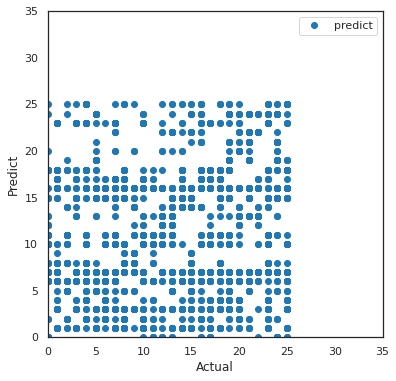

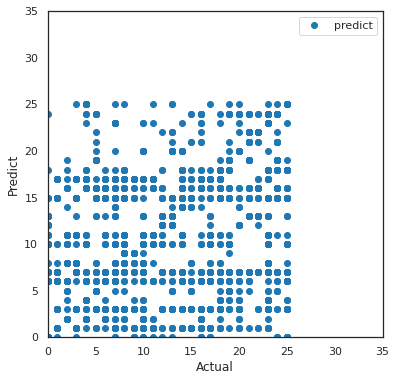

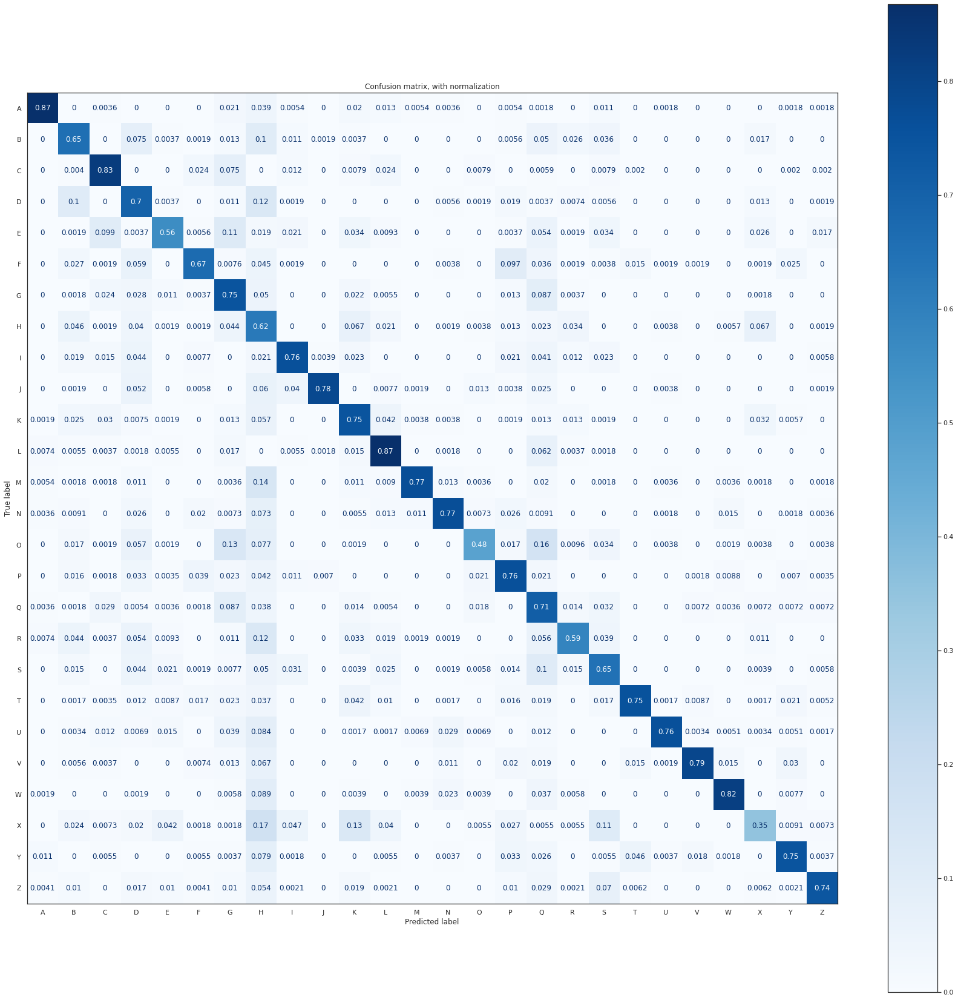

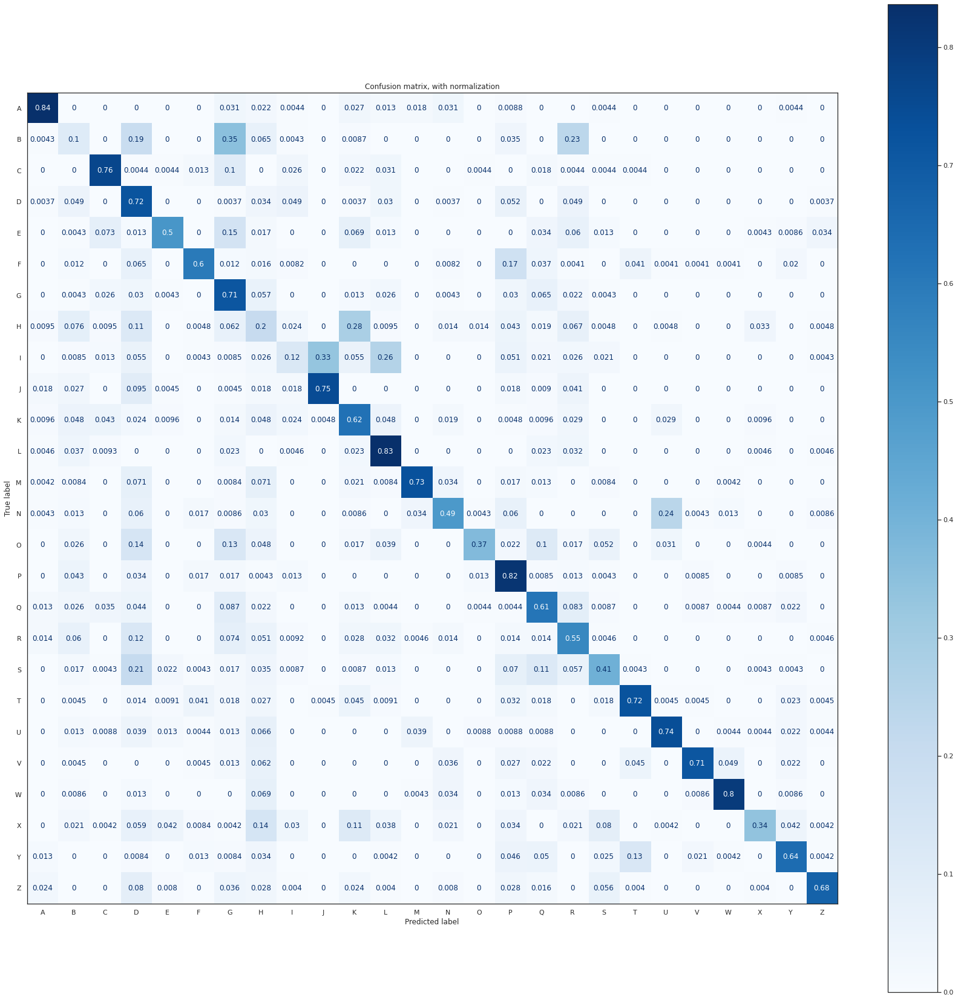

In [10]:
evaluation_metrics(gr)

for X, Y in [(X_train, Y_train), (X_test, Y_test)]:
    confusion_matrix_plotter(gr, X, Y, df_test['lettr'])

In [11]:
# to avoid having overfitting and computation complexity we set a max num of feat for choosing out split (change it to fine tune)

best_param = gr.best_estimator_.get_params()
print('Best Criterion:', *[i for i in best_param.items()], sep="\n")

dtc = DecisionTreeClassifier(random_state=12,
                            criterion=best_param['criterion'],
                            max_depth=best_param['max_depth'],
                            max_features=best_param['max_features'],
                            min_samples_leaf=best_param['min_samples_leaf'],
                            min_samples_split=best_param['min_samples_split'],
#                             splitter=best_param['splitter']
                            )

dtc = dtc.fit(X_train, Y_train)

# show some attr of our fitted model
print(f"node count: {dtc.tree_.node_count}\nmax depth: {dtc.tree_.max_depth}")
# help(dtc_fit.tree_)

# use cross-validation to fine tune hyperparameters
cross_score = cross_val(dtc, X_train, Y_train)

print(f"{'-' * 50}\n{cross_score.mean(): 0.2f} accuracy with a standard deviation of {cross_score.std(): 0.2f}")

Best Criterion:
('ccp_alpha', 0.0)
('class_weight', None)
('criterion', 'gini')
('max_depth', 10)
('max_features', 14)
('max_leaf_nodes', 200)
('min_impurity_decrease', 0.0)
('min_impurity_split', None)
('min_samples_leaf', 10)
('min_samples_split', 2)
('min_weight_fraction_leaf', 0.0)
('random_state', 12)
('splitter', 'best')
node count: 447
max depth: 10
--------------------------------------------------
 0.65 accuracy with a standard deviation of  0.03


In [12]:
# to avoid having overfitting and computation complexity we set a max num of feat for choosing out split (change it to fine tune)

dtc = DecisionTreeClassifier(criterion='entropy', max_features=10, max_depth=13, min_samples_split=50, min_samples_leaf=25, random_state=12)

dtc = dtc.fit(X_train, Y_train)

# show some attr of our fitted model
print(f"node count: {dtc.tree_.node_count}\nmax depth: {dtc.tree_.max_depth}")
# help(dtc_fit.tree_)

display(dtc.get_params())

# use cross-validation to fine tune hyperparameters
cross_score = cross_val(dtc, X_train, Y_train)

print(f"{'-' * 50}\n{cross_score.mean(): 0.2f} accuracy with a standard deviation of {cross_score.std(): 0.2f}")

node count: 645
max depth: 13


{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': 13,
 'max_features': 10,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 25,
 'min_samples_split': 50,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 12,
 'splitter': 'best'}

--------------------------------------------------
 0.70 accuracy with a standard deviation of  0.00


### Visualize our Decision Tree

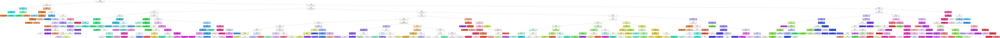

In [13]:
# Create an output destination for the file
dot_data = StringIO()

export_graphviz(dtc, out_file=dot_data, filled=True, feature_names=X_train.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

# Save the tree image
# filename = '3.decision_tree.png'
# graph.write_png(filename)

# View the tree image
Image(filename=filename) 

### Predict & Validate our model

micro      macro   weighted
train set accuracy    0.752183   0.752183   0.752183
          precision   0.752183   0.759134   0.759525
          recall      0.752183   0.751268   0.752183
          f1          0.752183   0.753538   0.754176
          MSE        27.359239  27.359239  27.359239
test set  accuracy    0.646077   0.646077   0.646077
          precision   0.646077   0.676984   0.676528
          recall      0.646077   0.644428   0.646077
          f1          0.646077   0.650980   0.651463
          MSE        38.767613  38.767613  38.767613

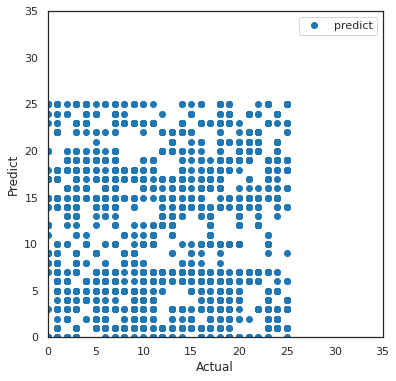

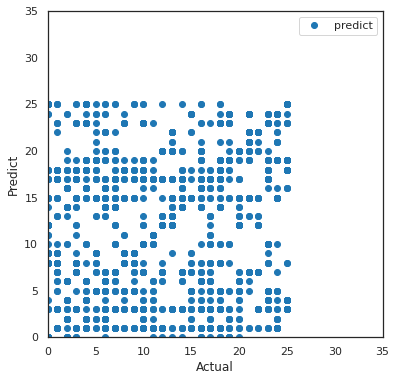

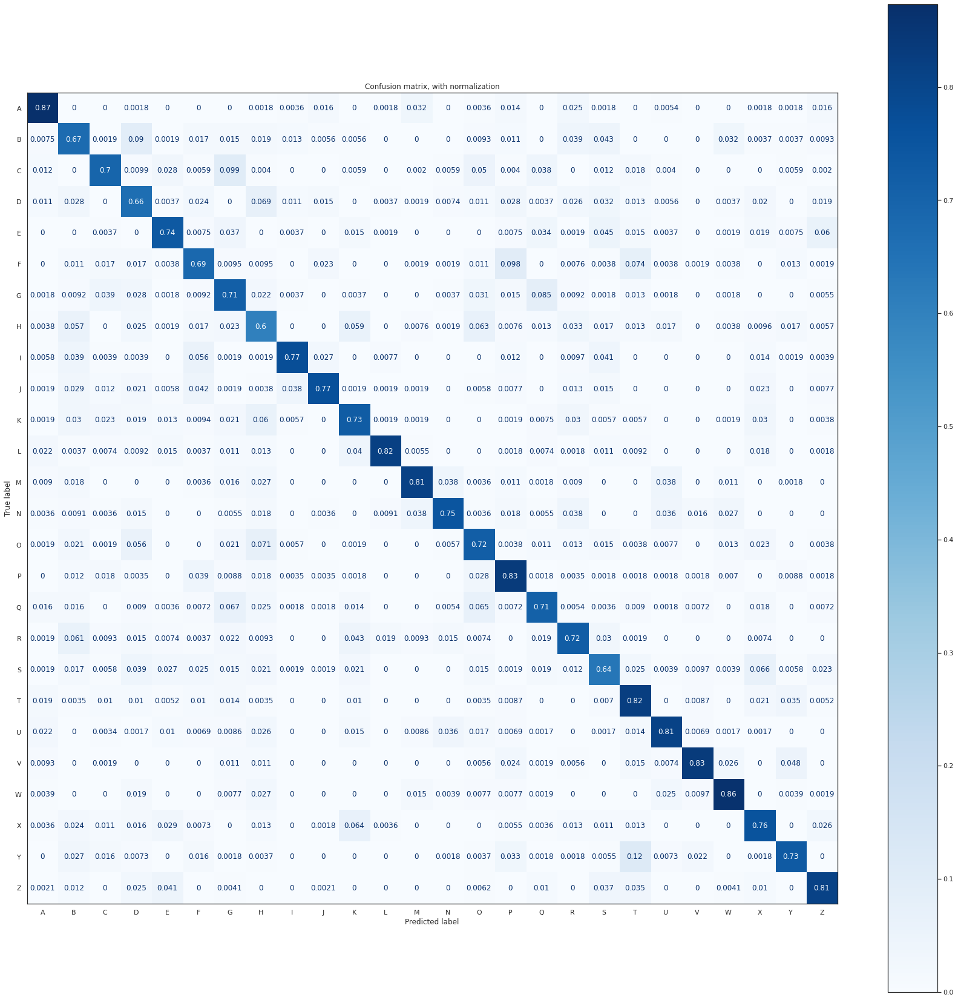

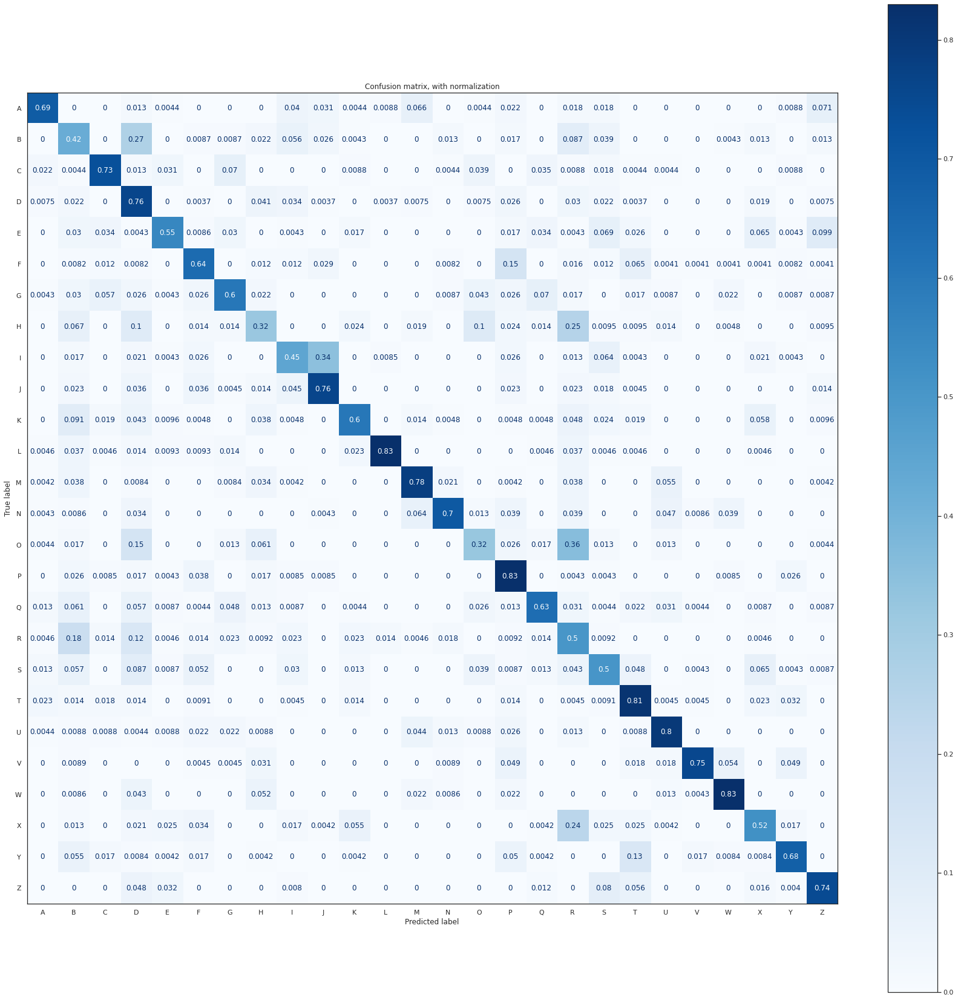

In [14]:
evaluation_metrics(dtc)

for X, Y in [(X_train, Y_train), (X_test, Y_test)]:
    confusion_matrix_plotter(dtc, X, Y, df_test['lettr'])

### visualize our model

## THE VERDICT
### As we saw in EDA our dataset is not "linearly separable"
#### even after grid search we couldn't improve our model by any means (even using grid search worsen the situation)